In [5]:
import arviz
import matplotlib.pyplot as plt
import pandas as pd
from utils.model import PresidentialElectionsModel
from utils.posteriorplots import predictive_plot, retrodictive_plot

In [6]:
arviz.style.use("arviz-darkgrid")
arviz.rcParams["plot.max_subplots"] = 50

In [7]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Model with socio-eco predictors

In [8]:
election_date = "2022-04-10"
timescales = [5, 14, 28]#], 42, 56]
weights = [0.3, 0.5, 0.2]#, 0.2, 0.1]

mb = PresidentialElectionsModel(election_date, timescales, weights)

/home/remi/.virtualenvs/presidentielles/lib/python3.9/site-packages/pandas/core/algorithms.py:440: FutureWarning: Comparison of Timestamp with datetime.date is deprecated in order to match the standard library behavior. In a future version these will be considered non-comparable. Use 'ts == pd.Timestamp(date)' or 'ts.date() == date' instead.
  uniques = table.unique(values)
/home/remi/.virtualenvs/presidentielles/lib/python3.9/site-packages/pandas/core/indexes/base.py:2237: FutureWarning: Comparison of Timestamp with datetime.date is deprecated in order to match the standard library behavior. In a future version these will be considered non-comparable. Use 'ts == pd.Timestamp(date)' or 'ts.date() == date' instead.
  return self._engine.is_unique
/home/remi/.virtualenvs/presidentielles/lib/python3.9/site-packages/pandas/core/indexes/base.py:3809: FutureWarning: Comparison of Timestamp with datetime.date is deprecated in order to match the standard library behavior. In a future version t

In [9]:
hierarchical_dm = mb.build_model()

In [10]:
idata_hierarchical_dm = mb.sample_all(
    draws=1000,
    var_names=[
        "latent_popularity",
        "latent_pop_t0",
        "R",
        "noisy_popularity",
        "N_approve",
    ],
)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [concentration_results, concentration_polls, election_party_time_coefs, lsd_election_party_raw, lsd_election_party_sd, lsd_election_effect, lsd_party_effect_election_party_amplitude, party_time_coefs_raw, lsd_party_effect_party_amplitude, lsd_intercept, unemployment_effect, house_election_effects_raw, house_election_effects_sd, house_effects, poll_bias, election_party_intercept, election_party_intercept_sd_party_effect, election_party_intercept_sd_intercept, party_intercept, party_intercept_sd]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 521 seconds.
/bin/ld: /tmp/tmp9894kf8v/tmp/tmp9894kf8v/source.o: in function `main':
/tmp/tmp9894kf8v/source.c:6: undefined reference to `cblas_ddot'
collect2: error: ld returned 1 exit status
The number of effective samples is smaller than 25% for some parameters.


In [11]:
arviz.to_netcdf(idata_hierarchical_dm, "../idata_hierarchical_dm.nc")

'../idata_hierarchical_dm.nc'

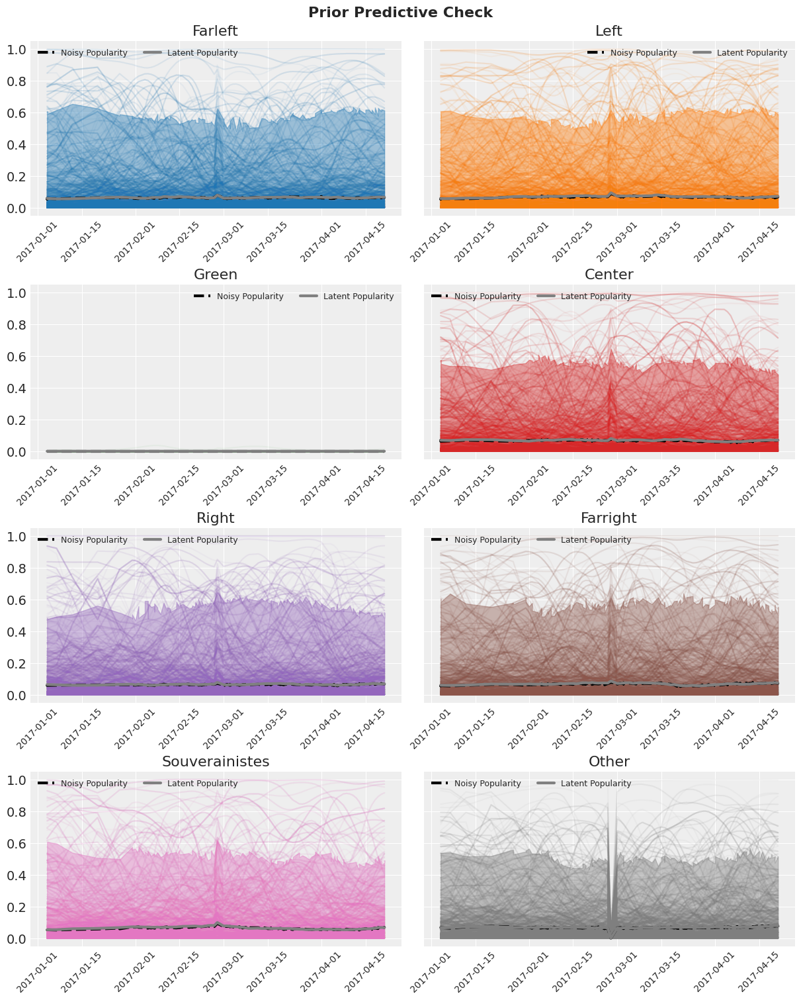

In [12]:
polls_train = mb.polls_train.copy()
retrodictive_plot(
    idata_hierarchical_dm.sel(
        elections="2017-04-23",
        observations=polls_train[polls_train.dateelection == "2017-04-23"].index,
    ),
    mb.political_families,
    polls_train[polls_train.dateelection == "2017-04-23"],
    group="prior",
)

In [13]:
election_forecast = mb.forecast_election(idata_hierarchical_dm)
results = mb.results_raw.copy()
polls_test = mb.polls_test.copy()

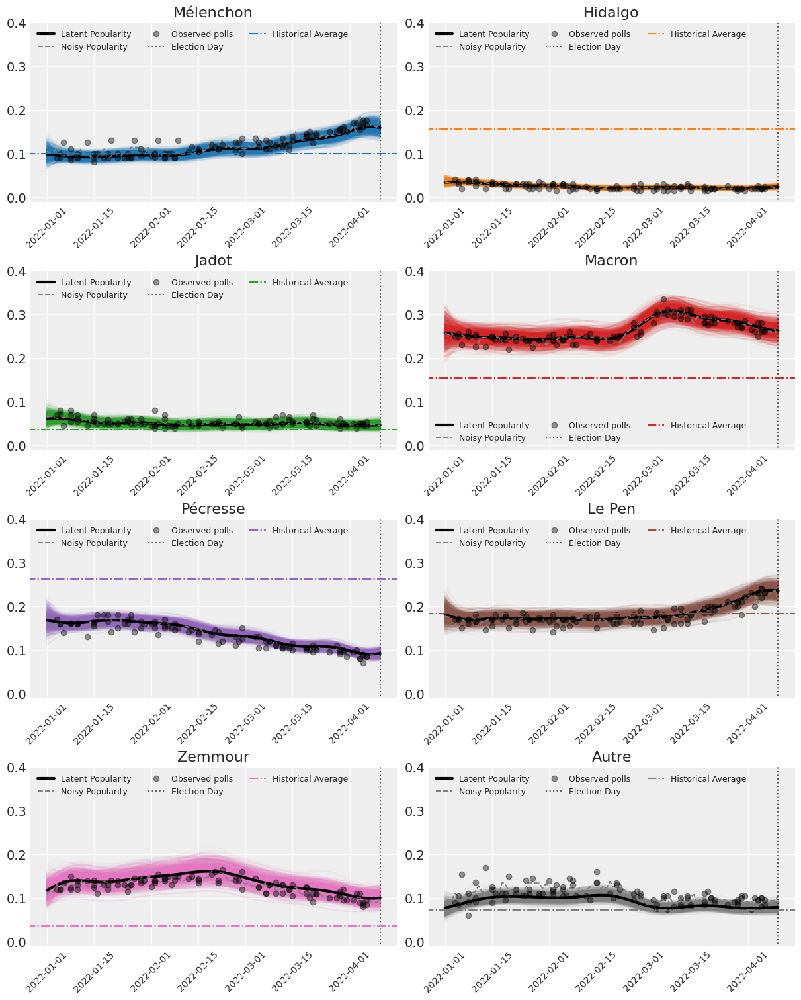

In [14]:
predictive_plot(
    idata=election_forecast,
    parties_complete=mb.political_families,
    election_date=election_date,
    polls_train=polls_train[polls_train.dateelection == election_date],
    polls_test=polls_test[polls_test.dateelection == election_date],
)

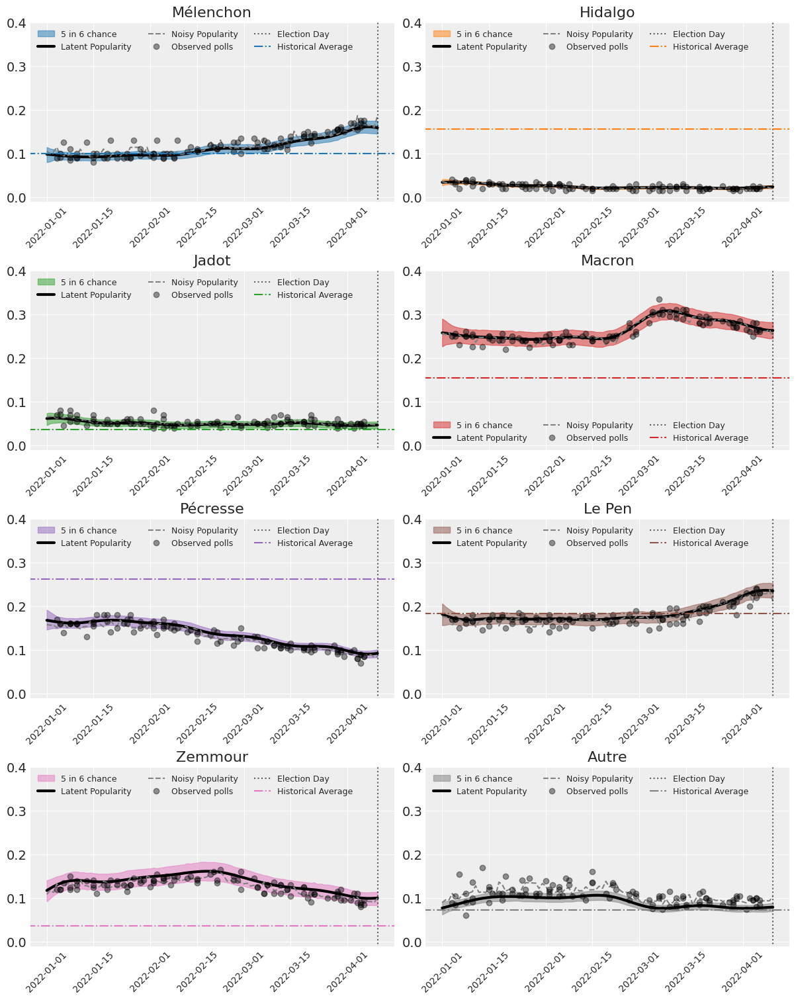

In [15]:
predictive_plot(
    idata=election_forecast,
    parties_complete=mb.political_families,
    election_date=election_date,
    polls_train=polls_train[polls_train.dateelection == election_date],
    polls_test=polls_test[polls_test.dateelection == election_date],
    hdi=True,
)

In [16]:
arviz.to_netcdf(election_forecast, "../election_forecast.nc")

'../election_forecast.nc'

In [17]:
summary = arviz.summary(idata_hierarchical_dm, round_to=2)
low_ess = summary[(summary.ess_bulk <= 1000) | (summary.ess_tail <= 1000)]

In [18]:
summary[(summary.ess_bulk <= 400) | (summary.ess_tail <= 400)]

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat


In [19]:
low_ess[
    (~low_ess.index.str.startswith("noisy"))
    & (~low_ess.index.str.startswith("latent"))
    & (~low_ess.index.str.startswith("election_party_time_effect"))
]

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
party_intercept[souverainistes],-1.01,0.17,-1.33,-0.69,0.01,0.00,944.34,1222.08,1.00
"election_party_intercept[2002-04-21T00:00:00.000000000, farleft]",-0.21,0.11,-0.43,-0.01,0.00,0.00,970.33,1512.34,1.00
"election_party_intercept[2002-04-21T00:00:00.000000000, left]",0.49,0.11,0.29,0.70,0.00,0.00,975.57,1404.47,1.00
"election_party_intercept[2002-04-21T00:00:00.000000000, center]",-1.32,0.12,-1.55,-1.11,0.00,0.00,863.58,1319.36,1.00
"election_party_intercept[2002-04-21T00:00:00.000000000, right]",0.04,0.11,-0.16,0.24,0.00,0.00,816.08,1253.27,1.00
...,...,...,...,...,...,...,...,...,...
"election_party_time_coefs[9, farright, 2017-04-23T00:00:00.000000000]",-0.23,0.09,-0.41,-0.06,0.00,0.00,947.41,1732.97,1.00
"election_party_time_coefs[9, farright, 2022-04-10T00:00:00.000000000]",0.20,0.08,0.07,0.35,0.00,0.00,871.67,1526.98,1.00
"election_party_time_coefs[9, souverainistes, 2002-04-21T00:00:00.000000000]",-0.12,0.73,-1.46,1.26,0.02,0.02,849.91,1372.03,1.00
"election_party_time_coefs[9, souverainistes, 2012-04-22T00:00:00.000000000]",-0.66,0.68,-2.04,0.52,0.02,0.02,773.59,1220.03,1.00


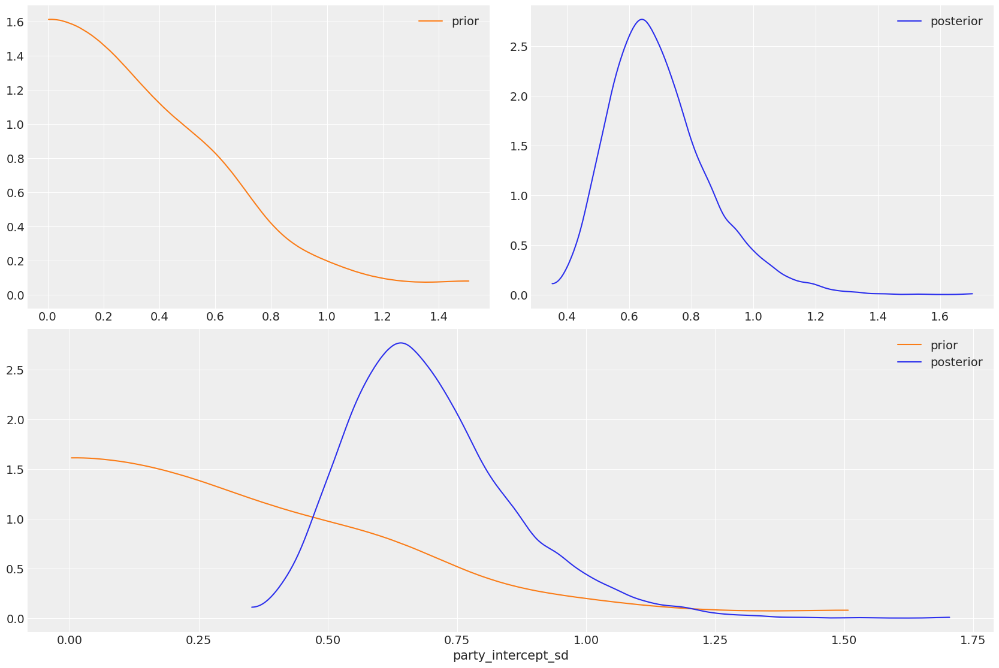

In [20]:
arviz.plot_dist_comparison(idata_hierarchical_dm, var_names="party_intercept_sd");

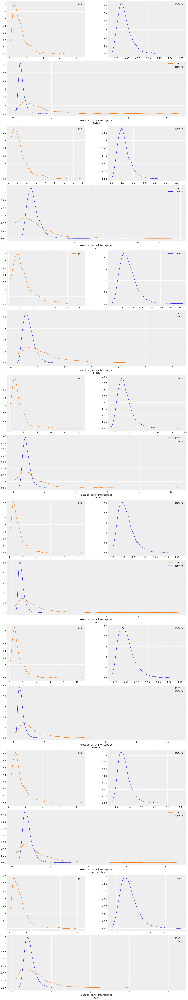

In [21]:
arviz.plot_dist_comparison(
    idata_hierarchical_dm, var_names="election_party_intercept_sd"
);

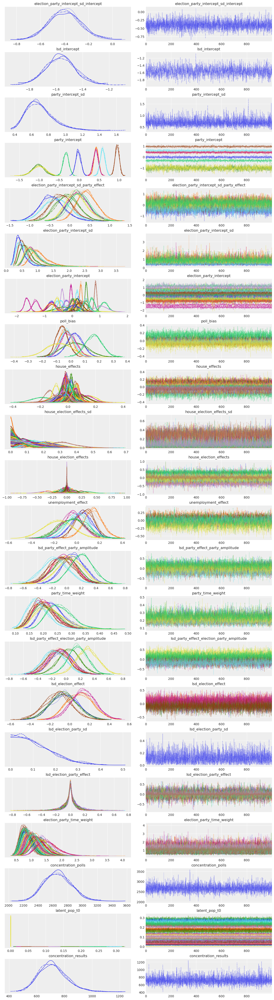

In [22]:
arviz.plot_trace(
    idata_hierarchical_dm,
    var_names=[
        "~time_effect",
        "~time_coefs",
        "~latent_popularity",
        "~noisy_popularity",
        "~raw",
    ],
    filter_vars="regex",
);

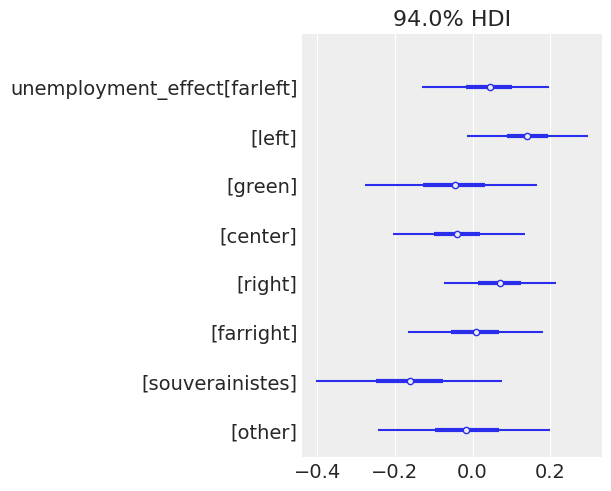

In [23]:
arviz.plot_forest(election_forecast, var_names="unemployment_effect", combined=True);

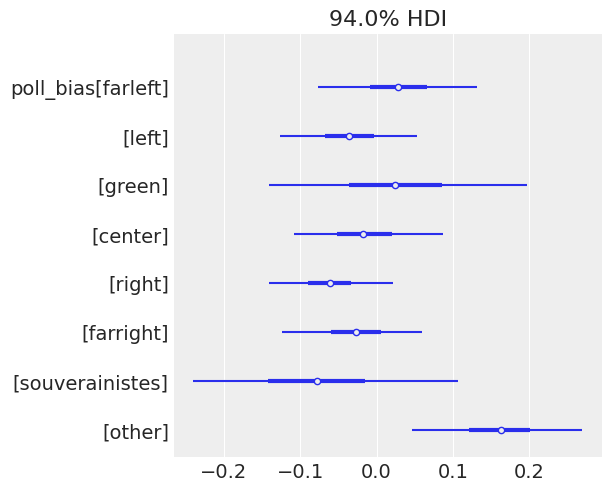

In [24]:
arviz.plot_forest(election_forecast, var_names="poll_bias", combined=True);

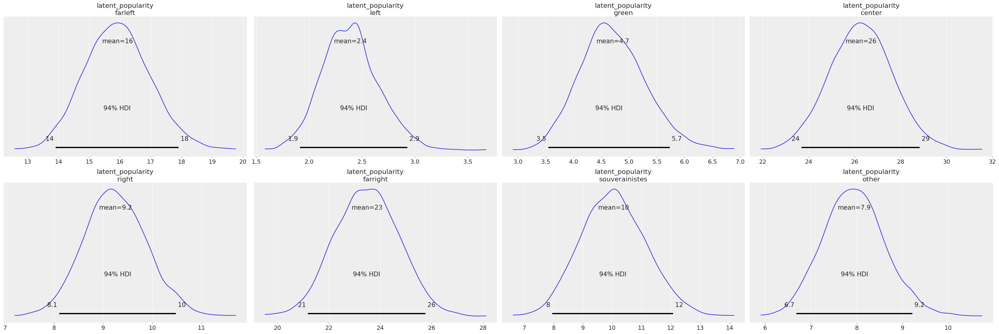

In [25]:
arviz.plot_posterior(
    election_forecast.predictions["latent_popularity"].sel(observations="2022-04-10")
    * 100,
);

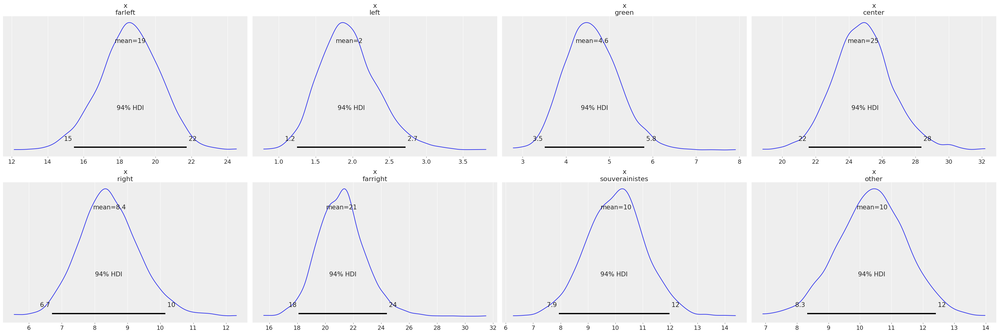

In [26]:
arviz.plot_posterior(
    (
        election_forecast.predictions["N_approve"]
        / election_forecast.predictions_constant_data["observed_N"]
    ).sel(observations="2022-04-10")
    * 100,
);

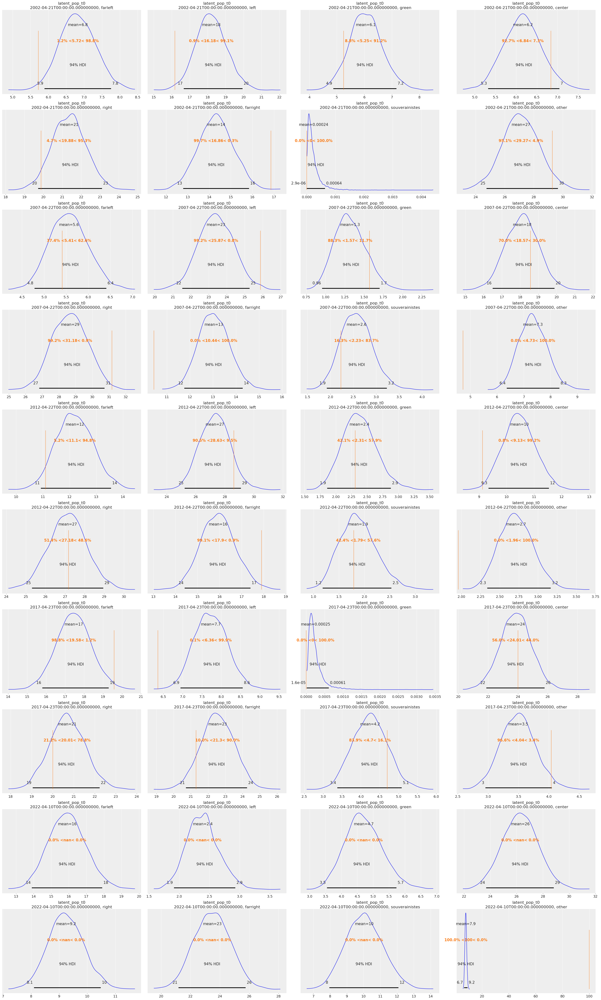

In [27]:
arviz.plot_posterior(
    election_forecast.predictions["latent_pop_t0"] * 100,
    ref_val=results[mb.political_families].to_numpy().flatten().tolist(),
);

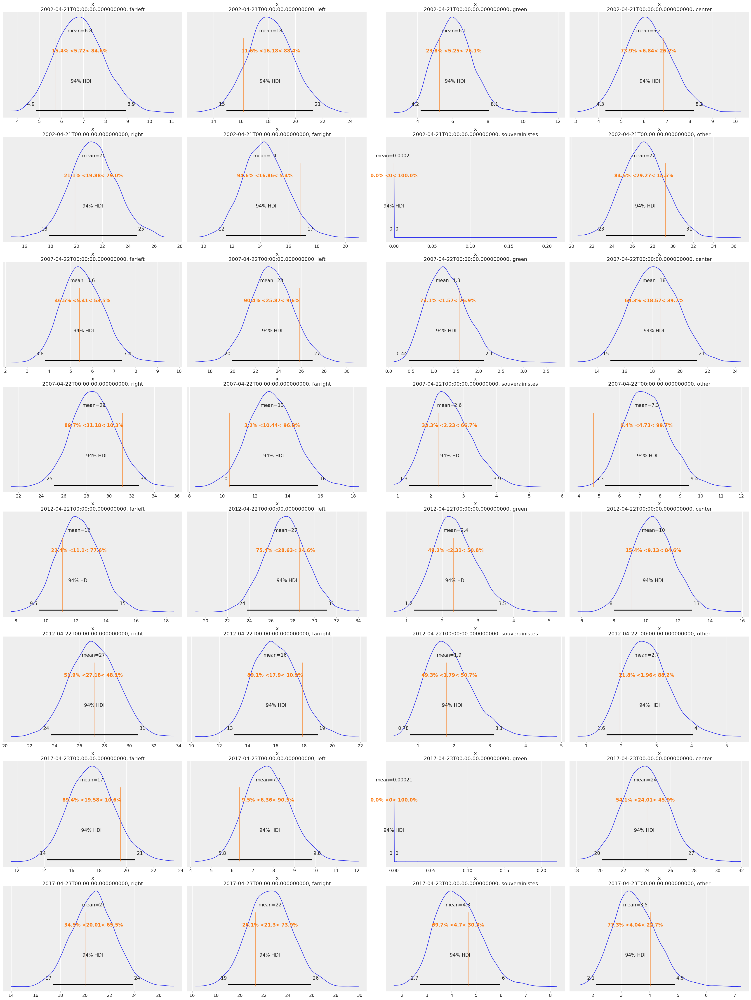

In [28]:
arviz.plot_posterior(
    (
        election_forecast.predictions["R"]
        / election_forecast.predictions_constant_data["results_N"]
    )
    * 100,
    ref_val=results[mb.political_families].to_numpy().flatten().tolist(),
);

In [29]:
def ridgeplot(date: str, latent: bool = True, ridgeplot: bool = True):

    if latent:
        election_day = (
            election_forecast.predictions["latent_popularity"].sel(observations=date)
            * 100
        )
    else:
        election_day = (
            election_forecast.predictions["N_approve"]
            / election_forecast.predictions_constant_data["observed_N"]
        ).sel(observations=date) * 100

    election_day["parties_complete"] = [
        "Mélenchon",
        "Hidalgo",
        "Jadot",
        "Macron",
        "Pécresse",
        "Le Pen",
        "Zemmour",
        "Autre",
    ]
    election_day.name = "Forecast"

    if ridgeplot:
        ax = arviz.plot_forest(
            election_day,
            kind="ridgeplot",
            hdi_prob=0.83,
            ridgeplot_truncate=False,
            figsize=(7, 8),
            ridgeplot_quantiles=[0.25, 0.5, 0.75],
            ridgeplot_overlap=2.3,
            ridgeplot_alpha=0.8,
            #ax=ax,
        )
    else:
        ax = arviz.plot_forest(election_day, kind="forestplot", hdi_prob=0.83, ax=ax)
    ax[0].axvline(10, ls="--", c="k", alpha=0.4)
    ax[0].axvline(20, ls="--", c="k", alpha=0.4)
    ax[0].axvline(30, ls="--", c="k", alpha=0.4)
    ax[0].axvline(40, ls="--", c="k", alpha=0.4)
    ax[0].set(title=f"Prévisions {date}", xlabel="% intentions exprimées", xlim=[0, 50])

    return

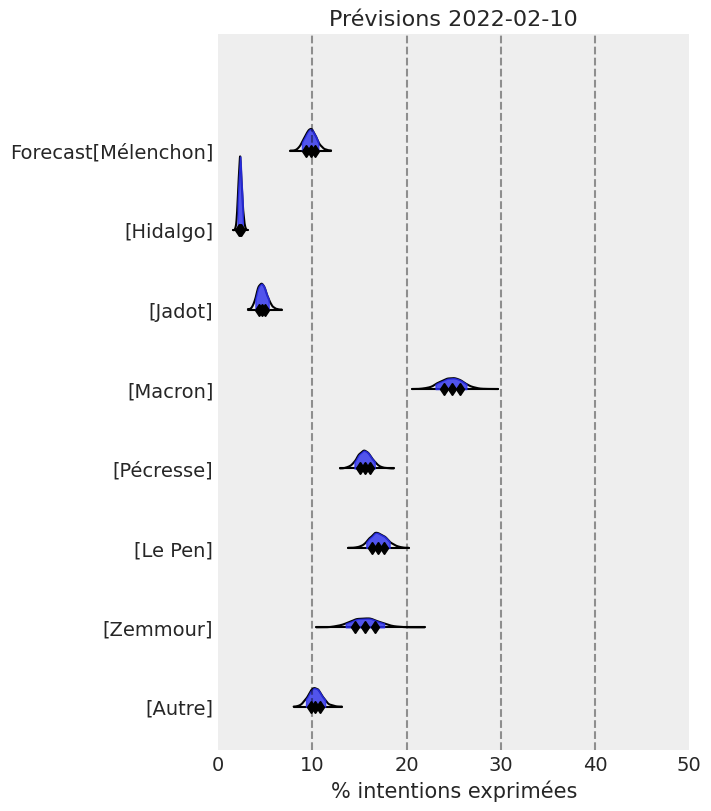

In [30]:
ridgeplot("2022-02-10", latent=True);

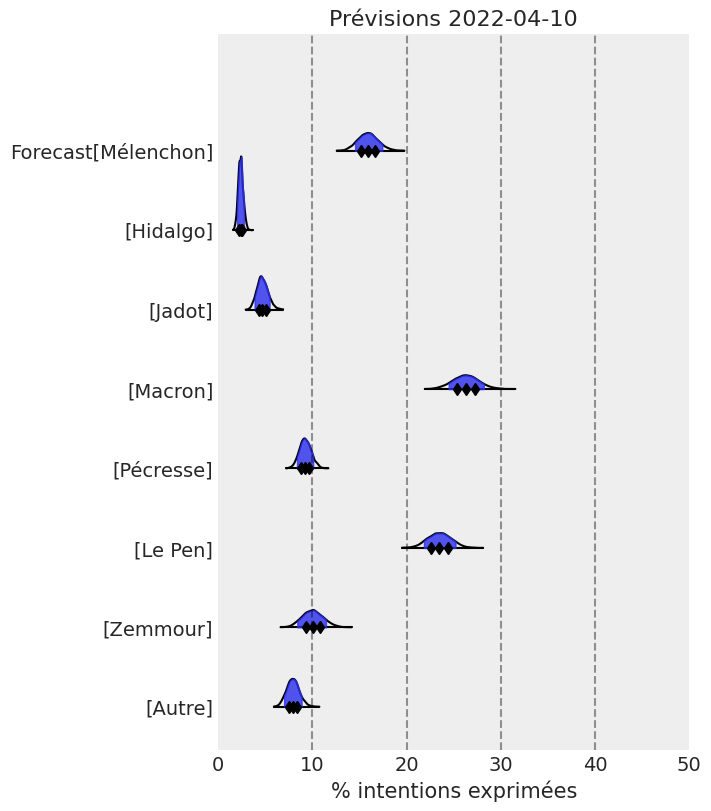

In [31]:
ridgeplot("2022-04-10", latent=True);

In [32]:
%load_ext watermark
%watermark -n -u -v -iv -a "Alexandre Andorra & Rémi Louf"

Author: Alexandre Andorra & Rémi Louf

Last updated: Tue Apr 12 2022

Python implementation: CPython
Python version       : 3.9.7
IPython version      : 8.0.1

pandas    : 1.4.1
matplotlib: 3.5.1
arviz     : 0.11.4



In [88]:
election_forecast.predictions

<xarray.Dataset>
Dimensions:             (chain: 1, draw: 12000, parties_complete: 8,
                         observations: 550, elections: 5, elections_observed: 4)
Coordinates:
  * chain               (chain) int64 0
  * draw                (draw) int64 0 1 2 3 4 ... 11995 11996 11997 11998 11999
  * parties_complete    (parties_complete) <U14 'farleft' 'left' ... 'other'
  * observations        (observations) datetime64[ns] 2002-01-02 ... 2022-04-10
  * elections           (elections) datetime64[ns] 2002-04-21 ... 2022-04-10
  * elections_observed  (elections_observed) datetime64[ns] 2002-04-21 ... 20...
Data variables:
    party_intercept     (chain, draw, parties_complete) float64 -0.009063 ......
    latent_popularity   (chain, draw, observations, parties_complete) float64 ...
    noisy_popularity    (chain, draw, observations, parties_complete) float64 ...
    N_approve           (chain, draw, observations, parties_complete) float64 ...
    latent_pop_t0       (chain, draw, elections, parties_complete) float64 0....
    R                   (chain, draw, elections_observed, parties_complete) float64 ...
Attributes:
    created_at:                 2022-04-08T16:05:57.248797
    arviz_version:              0.11.4
    inference_library:          pymc3
    inference_library_version:  3.11.4

In [89]:
 election_day = (
            election_forecast.predictions["latent_popularity"].sel(observations="2022-04-10")
            * 100
        )
candiates = [
        "Mélenchon",
        "Hidalgo",
        "Jadot",
        "Macron",
        "Pécresse",
        "Le Pen",
        "Zemmour",
        "Autre"]

In [90]:
scores = election_day.values[0]
num = scores.shape[0]

In [91]:
import numpy as np
np.sum(scores[:, 5] > scores[:, 3]) / num

0.04841666666666666

In [33]:
arviz.plot_posterior(ref_val=result)

NameError: name 'result' is not defined